# Optimizers with Momentum

<Axes: >

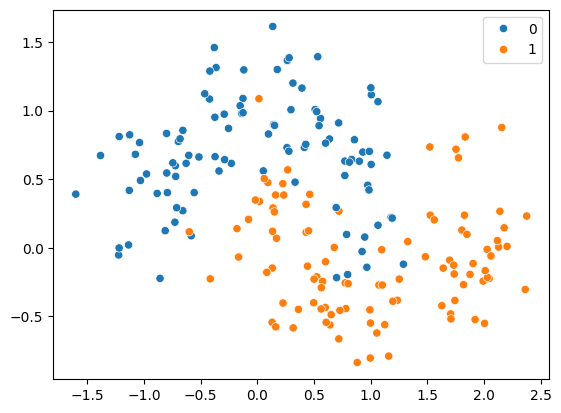

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
import seaborn as sns
X,y = make_moons(n_samples= 200 ,noise=0.25,random_state=42)

sns.scatterplot(x =X[:,0],y =X[:,1],hue=y)

In [2]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [3]:
import tensorflow as tf
import keras 
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD

In [4]:
model=  Sequential()
model.add(Dense(10,activation='relu',input_dim =2 ))
model.add(Dense(10,activation='relu' ))
model.add(Dense(10,activation='relu' ))
model.add(Dense(10,activation='relu' ))
model.add(Dense(1,activation='sigmoid'))

C:\Users\dell\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


# SGD

In [6]:
# implementing SGD
sgd =SGD(learning_rate=0.01, momentum=0.0 , nesterov=False )


sgd_optimizer = model.compile(loss='binary_crossentropy',metrics=['accuracy'],optimizer=sgd)

# SGD Momentum

In [9]:
# implementing SGD with momentum
sgd_momentum =SGD(learning_rate=0.01, momentum=0.9 , nesterov=False )


sgd_optimizer_momentum = model.compile(loss='binary_crossentropy',metrics=['accuracy'],optimizer=sgd_momentum)

#   NAG

In [10]:
# implementing NAG with momentum
NAG_momentum =SGD(learning_rate=0.01, momentum=0.9 , nesterov=True)


NAG_optimizer_momentum = model.compile(loss='binary_crossentropy',metrics=['accuracy'],optimizer=NAG_momentum)

# AdaGrad

In [11]:


from tensorflow.keras.optimizers import Adagrad

# Define Adagrad optimizer
adagrad = Adagrad(learning_rate=0.01)

# Compile a model
model.compile(optimizer=adagrad, loss='binary_crossentropy', metrics=['accuracy'])

# RMSprop

In [12]:
from tensorflow.keras.optimizers import RMSprop

# Define RMSprop optimizer
optimizer = RMSprop(learning_rate=0.001, rho=0.9)

# Compile a model
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [13]:
from tensorflow.keras.optimizers import Adam

# Compile a model
model.compile(optimizer ='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# 3D Animation


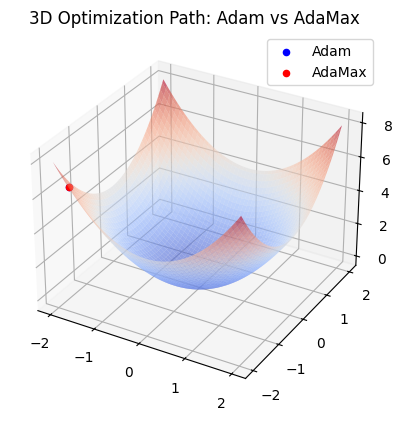

In [1]:


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from tensorflow.keras.optimizers import Adam, Adamax

# Generate a 3D loss surface (simulated quadratic loss function)
x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2  # Quadratic Loss Function

# Simulated optimization paths
adam_path = np.array([[-1.8 + 0.1*i, -1.8 + 0.1*i] for i in range(30)])
adamax_path = np.array([[-1.8 + 0.08*i, -1.8 + 0.09*i] for i in range(30)])

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the loss surface
ax.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.6)

# Scatter initial points
adam_scatter = ax.scatter(adam_path[0, 0], adam_path[0, 1], adam_path[0, 0]**2 + adam_path[0, 1]**2, color='blue', label='Adam')
adamax_scatter = ax.scatter(adamax_path[0, 0], adamax_path[0, 1], adamax_path[0, 0]**2 + adamax_path[0, 1]**2, color='red', label='AdaMax')

def update(frame):
    """Update function for animation"""
    adam_scatter._offsets3d = (adam_path[:frame, 0], adam_path[:frame, 1], adam_path[:frame, 0]**2 + adam_path[:frame, 1]**2)
    adamax_scatter._offsets3d = (adamax_path[:frame, 0], adamax_path[:frame, 1], adamax_path[:frame, 0]**2 + adamax_path[:frame, 1]**2)
    return adam_scatter, adamax_scatter

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(adam_path), interval=200, blit=False)

# Show plot
plt.legend()
plt.title("3D Optimization Path: Adam vs AdaMax")
plt.show()

In [2]:
from IPython.display import HTML
HTML(ani.to_jshtml())

# FTRL

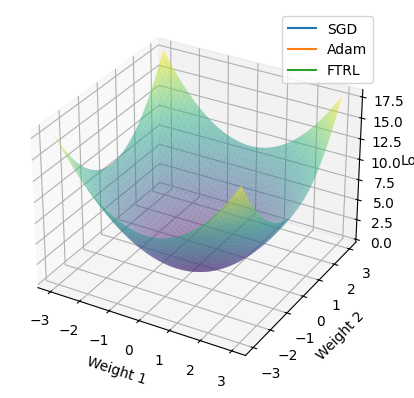

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
import tensorflow as tf
from tensorflow.keras.optimizers import SGD, Adam, Ftrl

# Define a simple quadratic loss function
def loss_function(w):
    return w[0]**2 + w[1]**2

# Initialize weights
w_init = np.array([3.0, 3.0], dtype=np.float32)
optimizers = {
    "SGD": SGD(learning_rate=0.1),
    "Adam": Adam(learning_rate=0.1),
    "FTRL": Ftrl(learning_rate=0.1)
}

# Store optimization paths
paths = {key: [w_init.copy()] for key in optimizers.keys()}

for key, optimizer in optimizers.items():
    w = tf.Variable(w_init.copy())
    for _ in range(50):  # 50 iterations
        with tf.GradientTape() as tape:
            loss = loss_function(w)
        gradients = tape.gradient(loss, [w])
        optimizer.apply_gradients(zip(gradients, [w]))
        paths[key].append(w.numpy().copy())

# Convert paths to numpy arrays
for key in paths.keys():
    paths[key] = np.array(paths[key])

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('Weight 1')
ax.set_ylabel('Weight 2')
ax.set_zlabel('Loss')

# Create a mesh grid for the loss function
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
Z = X**2 + Y**2
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.5)

# Initialize lines for each optimizer
lines = {key: ax.plot([], [], [], label=key)[0] for key in optimizers.keys()}
ax.legend()

def update(frame):
    for key in paths.keys():
        line = lines[key]
        line.set_data(paths[key][:frame, 0], paths[key][:frame, 1])
        line.set_3d_properties([loss_function(w) for w in paths[key][:frame]])
    return lines.values()

ani = animation.FuncAnimation(fig, update, frames=50, interval=100, blit=False)
plt.show()


In [4]:
from IPython.display import HTML
HTML(ani.to_jshtml())